<h1 style="text-align: center;"> This file provides functions for drawing Figures from the paper 
    <h2 style="text-align: center;"> <b>"Impact of Pre- and Post-Processing Steps for Supervised Classification of Colorectal Cancer in Hyperspectral Images" </b> </h2>
</h1> 
<h3> It contains code for: <br>
    - Figures 1, 6, 7, 12, 13, 14, 15<br>
    - Calculating of a statical significance of using post-processing<br>
    - Some other stuff for paper (drawing colorbars, comparing with previous results, drawing sigmoid function)<br>
    - And some minor experiments<br><br>
Please execute all cells before Figure 1
</h3>

<h3>
    Paper: <a href='https://www.mdpi.com/2233040'>https://www.mdpi.com/2233040 </a> <br>
    Documentation: <a href='https://git.iccas.de/MaktabiM/hsi-experiments/-/wikis/Post-processing'>https://git.iccas.de/MaktabiM/hsi-experiments/-/wikis/Post-processing </a> <br> <br>
    
    The notebook is divided into sections for simplicity
</h3>

In [1]:
import numpy as np
import imageio as iio
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter
from glob import glob
import csv
import os
import random
from tqdm import tqdm
import pandas as pd

In [2]:
def get_predictions():
    return np.load('/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test/CV_3d_inception/cp-0036/predictions_whole.npy', allow_pickle=True)

def get_prediction_maps():
    predictions = get_predictions()

    prediction_maps = []

    for i in range(3):
        prediction_maps.append(np.reshape(predictions[10+i]['predictions'], (480, 640)))
        
    return prediction_maps

<h1 style="text-align: center;"> Figure 1. Just show examples of ground truth masks </h1>

/work/mi186veva-MySpace/data_dat/2019_08_23_12_15_26_SpecCube.dat_Mask JW Kolo.png
/work/mi186veva-MySpace/data_dat/2020_05_20_12_06_41_SpecCube.dat_Mask JW Kolo.png
/work/mi186veva-MySpace/data_dat/2019_12_09_14_32_17_SpecCube.dat_Mask JW Kolo.png
/work/mi186veva-MySpace/data_dat/2020_03_18_16_40_53_SpecCube.dat_Mask JW Kolo.png


/tmp/ipykernel_3238841/781019824.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = iio.imread(masks[i])


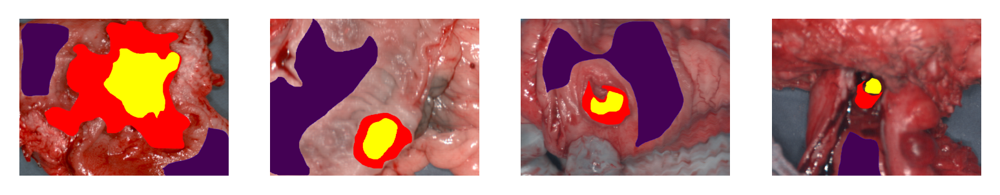

In [5]:
#masks = glob('C:\\Users\\tkachenko\\Desktop\\HSI\\data masks\\*.png')
masks = glob('/work/mi186veva-MySpace/data_dat/*.png')

fig, ax = plt.subplots(1, 4, dpi=300)

#for index, i in enumerate([2, 48, 50, 3]):
for index, i in enumerate([46, 2, 3, 4]):
    print(masks[i])
    im = iio.imread(masks[i])
    im[(im[:, :, 0] == 0) & (im[:, :, 1] == 0) & (im[:, :, 2] == 255)] = (68, 1, 84) #change color from blue to violet for consistency
    ax[index].imshow(im)
    ax[index].axis('off')

plt.savefig(os.path.join('images','masks_of_4_patients.png'))
plt.show()

<h1 style="text-align: center;"> Figure 6. Effects of median filter </h1>

/tmp/ipykernel_871773/1977748274.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = iio.imread(os.path.join('images', 'cat.jpg'))


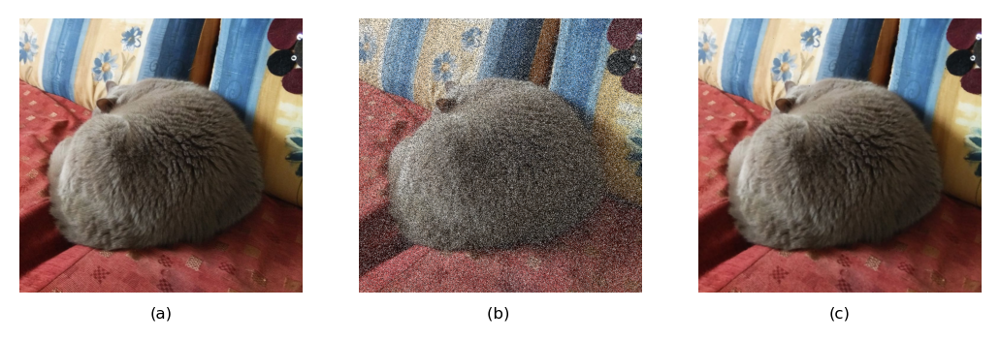

In [4]:
#+++++++++++++++++++++++++ draw noise and effect of median_filter (Figure 6)
img = iio.imread(os.path.join('images', 'cat.jpg'))

white_fraction = 20 #percentage
black_fraction = 20 #percentage

def add_noise(img, color, fraction):
    
    for _ in range(int(img.shape[0] * img.shape[1] * fraction / 100)):
        
        x = np.random.randint(img.shape[0])
        y = np.random.randint(img.shape[1])
        img[x, y] = [color, color, color]
    
    return img

img_ = add_noise(img.copy(), 255, white_fraction)
img_ = add_noise(img_, 0, black_fraction)
img__ = img_.copy()
img__[..., 0] = median_filter(img_[..., 0], size=5)
img__[..., 1] = median_filter(img_[..., 1], size=5)
img__[..., 2] = median_filter(img_[..., 2], size=5)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, dpi=200)
ax1.imshow(img)
ax2.imshow(img_)
ax3.imshow(img__)
ax1.set_title('(a)', fontdict={'fontsize': 6}, y=-0.15)
ax2.set_title('(b) ', fontdict={'fontsize': 6}, y=-0.15)
ax3.set_title('(c)', fontdict={'fontsize': 6}, y=-0.15)
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')


plt.savefig(os.path.join('images','cat_.png'))
plt.show()


<h1 style="text-align: center;"> Figure 7. Shows prediction maps with corresponding ground truth images </h1>

/tmp/ipykernel_871773/2607720856.py:14: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  gt = iio.imread('/work/users/mi186veva/data_dat/'+predictions[i]['name']+'SpecCube.dat_Mask JW Kolo.png')
/tmp/ipykernel_871773/2607720856.py:26: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  gt = iio.imread('/work/users/mi186veva/data_dat/'+predictions[i2]['name']+'SpecCube.dat_Mask JW Kolo.png')


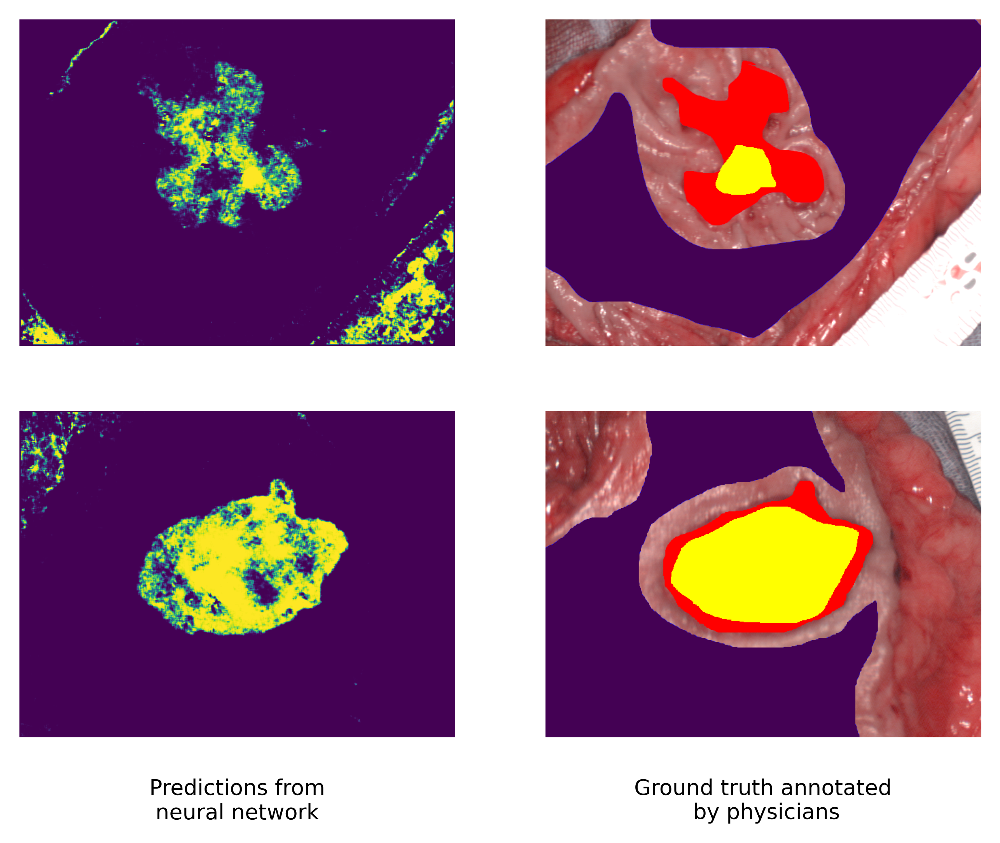

In [5]:
# yeah, now automatised for different number of patients, only for 2, but it's easy to change
masks = glob('/work/users/mi186veva/data_dat/*.png')
'_SpecCube.dat_Mask JW Kolo'

#indexes of patients to show
i=6
i2=52

predictions = get_predictions()

fig, ax = plt.subplots(2, 2, dpi=500)
ax[0, 0].imshow(np.reshape(predictions[i]['predictions'], (480, 640)))

gt = iio.imread('/work/users/mi186veva/data_dat/'+predictions[i]['name']+'SpecCube.dat_Mask JW Kolo.png')
gt[(gt[:, :, 0] == 0) & (gt[:, :, 1] == 0) & (gt[:, :, 2] == 255)] = (68, 1, 84)  #change color from blue to violet for consistency
ax[0, 1].imshow(gt)

ax[0, 0].axis('off')
ax[0, 1].axis('off')

#----------------

ax[1, 0].imshow(np.reshape(predictions[i2]['predictions'], (480, 640)))
ax[1, 0].set_title('Predictions from\nneural network', fontdict={'fontsize': 8}, y=-0.3)

gt = iio.imread('/work/users/mi186veva/data_dat/'+predictions[i2]['name']+'SpecCube.dat_Mask JW Kolo.png')
gt[(gt[:, :, 0] == 0) & (gt[:, :, 1] == 0) & (gt[:, :, 2] == 255)] = (68, 1, 84) #change color from blue to violet for consistency
ax[1, 1].imshow(gt)
ax[1, 1].set_title('Ground truth annotated\n by physicians', fontdict={'fontsize': 8}, y=-0.3)

ax[1, 0].axis('off')
ax[1, 1].axis('off')

plt.savefig(os.path.join('images','predictions_of_2_patient_with_gt.png'))

plt.show()

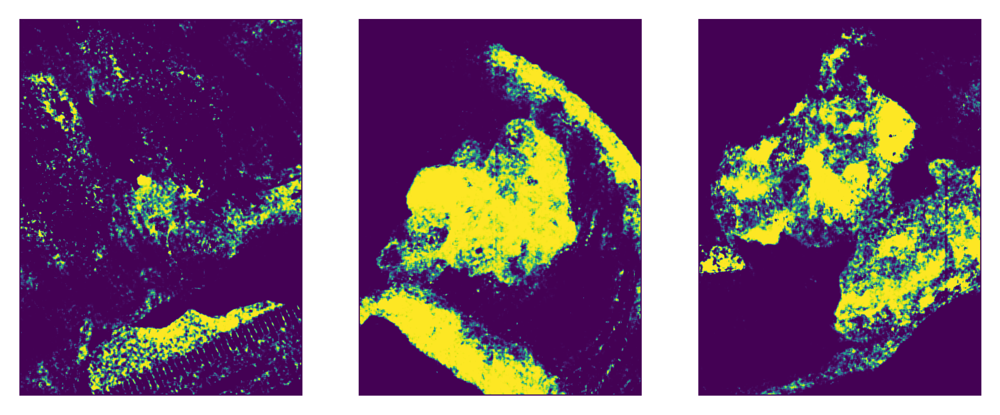

In [6]:
#old version of Figure 7 (just prediction maps)
prediction_maps = get_prediction_maps()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, dpi=500)
ax1.imshow(prediction_maps[0].T)
ax2.imshow(prediction_maps[1].T)
ax3.imshow(prediction_maps[2].T)
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')

plt.savefig(os.path.join('images','predictions_of_3_patients.png'))
plt.show()

<h1 style="text-align: center;"> Figures 12, 13. For one patient for all models show how post-processing improves performance with the optimal corresponding parameters </h1>

/tmp/ipykernel_871773/42935154.py:91: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  gt = iio.imread(glob(os.path.join(masks_path, patient_name+'*.png'))[0])
/tmp/ipykernel_871773/42935154.py:91: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  gt = iio.imread(glob(os.path.join(masks_path, patient_name+'*.png'))[0])
/tmp/ipykernel_871773/42935154.py:91: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread`

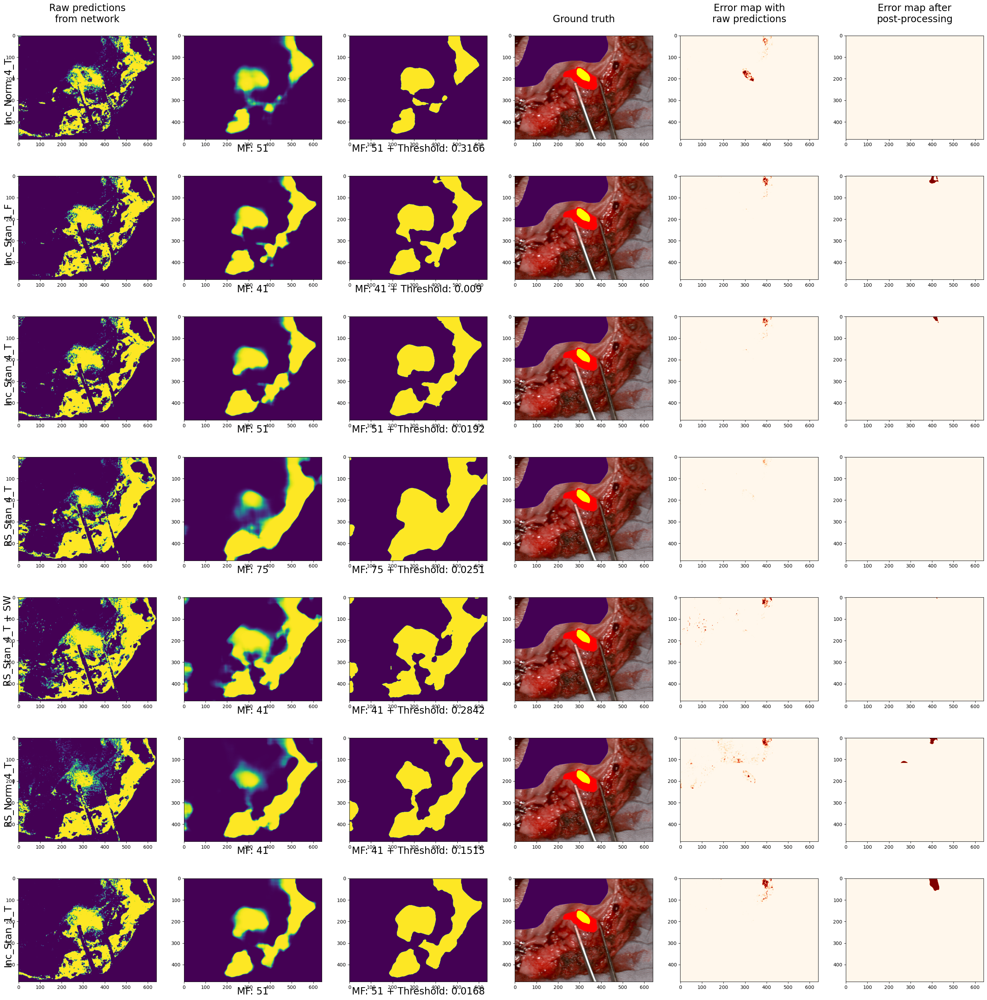

In [7]:
# original code for Figures 12, 13 (like in paper)
# draw maps for the optimal post-processing params
# In whole table we use the same patient
# Each raw corresponds for one model
# Columns:
# 1) Prediction map without post-processing
# 2) Prediction map after applying of optimal MF size (optimal for this model)
# 3) Prediction map after applying of oprimal MF size and threshold (optimal for this model)
# 4) Ground truth
# 5) Error map without post-processing
# 6) Error map with post-processing
# Turn on GPU (during the starting page of JupyterLab), otherwise it will last forever
# But anyway drawing can take a while
# For further details please refer to the paper

#patient_name = '2020_03_27_16_56_41_'
#patient_name = '2020_03_27_11_31_09_'
patient_name = '2019_12_23_17_52_55_'
#patient_name = 'CP1'

def turn_off_axis(ax):
    for i in range(len(ax)):
        if isinstance(ax[0], list):
            for j in range(len(ax[0])):
                ax[i, j].axis('off')
            else:
                ax[i].axis('off')

paths = [
    'CV_3d_inception/cp-l2_norm_0036/',
    'CV_3d_inception_exclude1_all/cp-svn_T_0016',
    'CV_3d_inception_svn_every_third/cp-svn_T_0018',
    'CV_3d_svn_every_third/cp-svn_T_0016',
    'CV_3d_sample_weights_every_third/cp-svn_T_0018',
    'CV_3d_every_third/cp-l2_norm_0016',
    'CV_3d_inception_exclude1_every_third/cp-svn_T_0016',
]

models = ['Inc_Norm_4_T',
        'Inc_Stan_1_F',
        'Inc_Stan_4_T',
        'RS_Stan_4_T',
        'RS_Stan_4_T + SW',
        'RS_Norm_4_T',
        'Inc_Stan_1_T'
        ]

thresholds = [ 0.3166,
                0.009,
                0.0192,
                0.0251,
                0.2842,
                0.1515,
                0.0168
                ]

mf_sizes = [51,
            41,
            51,
            75,
            41,
            41,
            51
            ]

masks_path = '/work/users/mi186veva/data_dat/'
test_path = '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test/'

fig, ax = plt.subplots(len(paths), 6, figsize=(36, 36))
turn_off_axis(ax)
#plt.subplots_adjust(wspace=0.1, hspace=0.1)

i = 0
for path, threshold, mf_size, model in zip(paths, thresholds, mf_sizes, models):    
    raw_predictions = np.load(os.path.join(test_path, path,'predictions_whole.npy'), allow_pickle=True)
    
    new_metrics = pd.read_csv(os.path.join(test_path, path, f'mf_{mf_size}_t_-1', f'metrics_by_threshold_filtered_{mf_size}_{threshold}.csv' ), header=0)
    
    patient_index = 0
    for row in raw_predictions:
        if row['name'] == patient_name:
            break
        patient_index += 1
    patient = raw_predictions[patient_index]
    patient_name = patient['name']
    
    predictions = np.resize(patient['predictions'], patient['size'])
    prediction_mf = median_filter(predictions, size=mf_size)
    prediction_mf_thresholded = np.where(prediction_mf > threshold, 1, 0)
    
    gt = iio.imread(glob(os.path.join(masks_path, patient_name+'*.png'))[0])
    gt[(gt[:, :, 0] == 0) & (gt[:, :, 1] == 0) & (gt[:, :, 2] == 255)] = (68, 1, 84)   #change color to violet for consistancy
    
    ax[i, 0].imshow(predictions)
    ax[0, 0].set_title('Raw predictions\nfrom network', fontdict={'fontsize': 20}, y=1.1)
    ax[i, 0].text(-70, 400, f'{model}', fontdict={'fontsize': 20}, rotation=90)
    
    #ax[i, 1].imshow(gt) # for debug
    ax[i, 1].imshow(prediction_mf)    
    ax[i, 1].set_title(f'MF: {mf_size}', fontdict={'fontsize': 20}, y=-0.15)
    
    #ax[i, 2].imshow(gt) # for debug
    ax[i, 2].imshow(prediction_mf_thresholded)
    ax[i, 2].set_title(f'\nMF: {mf_size} + Threshold: {threshold}', fontdict={'fontsize': 20}, y=-0.15)
    
    ax[i, 3].imshow(gt)
    ax[0, 3].set_title('Ground truth', fontdict={'fontsize': 20}, y=1.1)
        
    
    error_map = np.zeros(gt.shape[:2])
    background_mask = np.zeros(gt.shape[:2])
    healthy_indexes = (gt[:, :, 0] == 68) & (gt[:, :, 1] == 1) & (gt[:, :, 2] == 84)
    cancer_indexes = (gt[:, :, 0] == 255) & (gt[:, :, 1] == 255) & (gt[:, :, 2] == 0)
    error_map[cancer_indexes] = 1#(68, 1, 84)
    background_mask[healthy_indexes] = 1
    background_mask[cancer_indexes] = 1
    
    #without post-prossing
    error_map_0 = np.abs(error_map - predictions)
    error_map_0[background_mask == 0] = 0
    ax[i, 4].imshow(error_map_0, cmap='OrRd')
    #ax[i, 4].imshow(gt)  #for debug
    ax[0, 4].set_title('Error map with\nraw predictions', fontdict={'fontsize': 20}, y=1.1)
    
    #with post-processing
    error_map_1 = np.abs(error_map - prediction_mf_thresholded)
    error_map_1[background_mask == 0] = 0
    ax[i, 5].imshow(error_map_1, cmap='OrRd')
    #ax[i, 5].imshow(gt)  # for debug
    ax[0, 5].set_title('Error map after\npost-processing', fontdict={'fontsize': 20}, y=1.1)
    
    i+=1
    
    

plt.savefig(os.path.join('images', f'best_parameters_{patient_name}.png'))    
plt.show()


<h1 style="text-align: center;"> Figures 14, 15 </h1>
<h2 style="text-align: center;"> Figure 14 shows how different thresholds and median filter sizes (MF) affect visual results -> use draw_AWT() </h2>
<h2 style="text-align: center;"> Figure 15 shows how only differend MF sizes affect the visual results -> use draw_AP() </h2>
<h2 style="text-align: center;"> For more details please refer to the paper </h2>

/work/users/mi186veva/data_dat/2019_08_09_12_17_55_SpecCube.dat_Mask JW Kolo.png


/tmp/ipykernel_871773/206962391.py:61: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  gt = iio.imread(masks[patient])


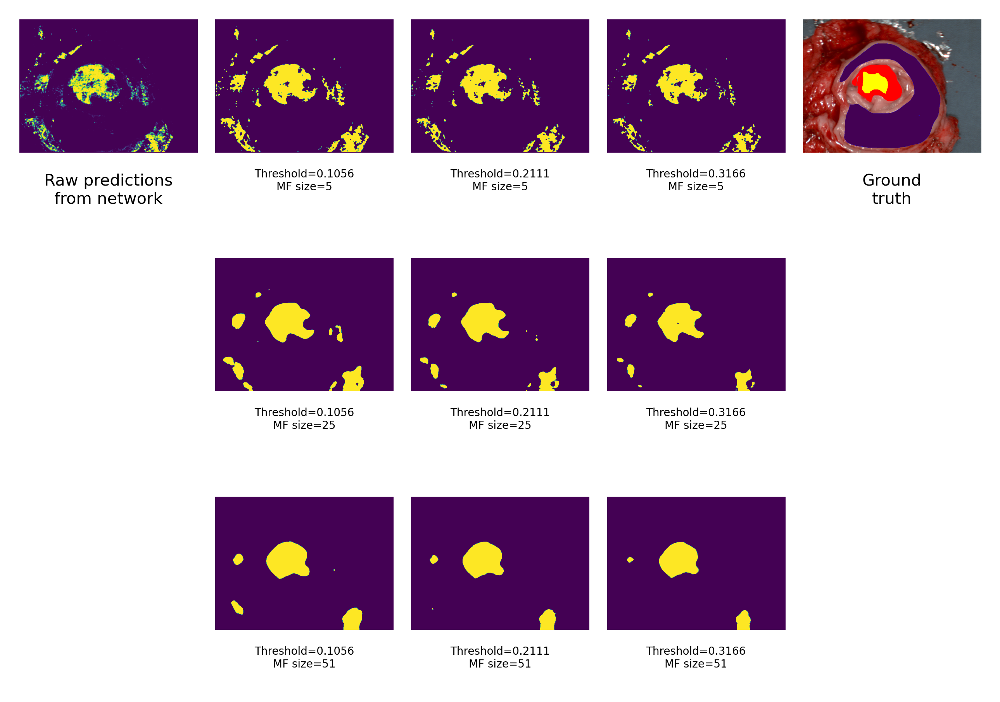

/work/users/mi186veva/data_dat/2019_12_20_15_15_21_SpecCube.dat_Mask JW Kolo.png


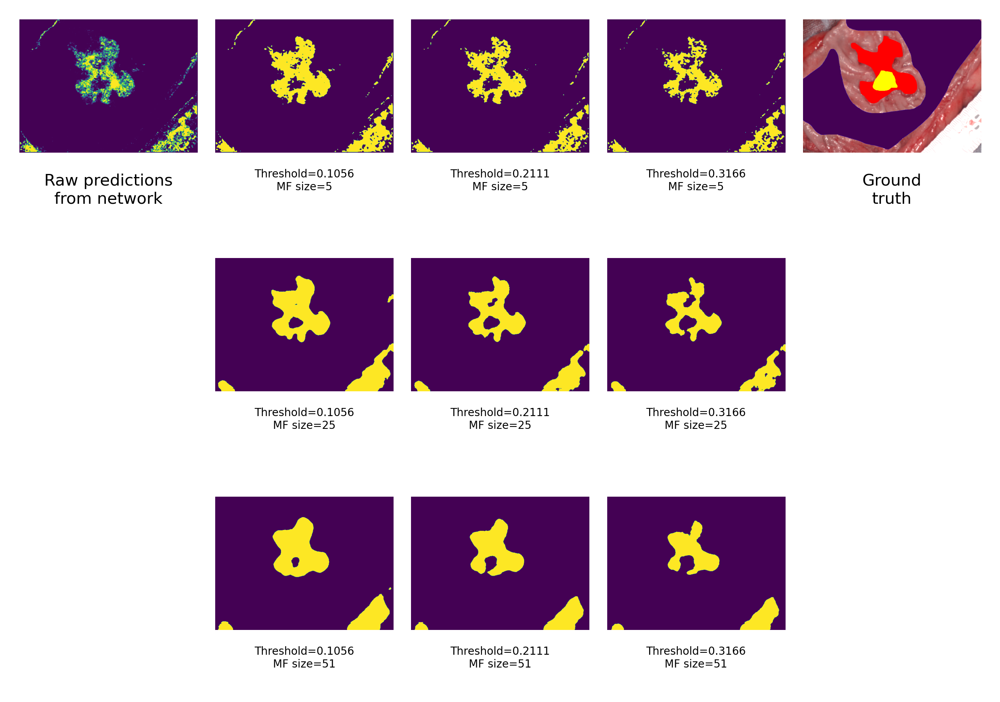

/work/users/mi186veva/data_dat/2020_03_20_15_36_36_SpecCube.dat_Mask JW Kolo.png


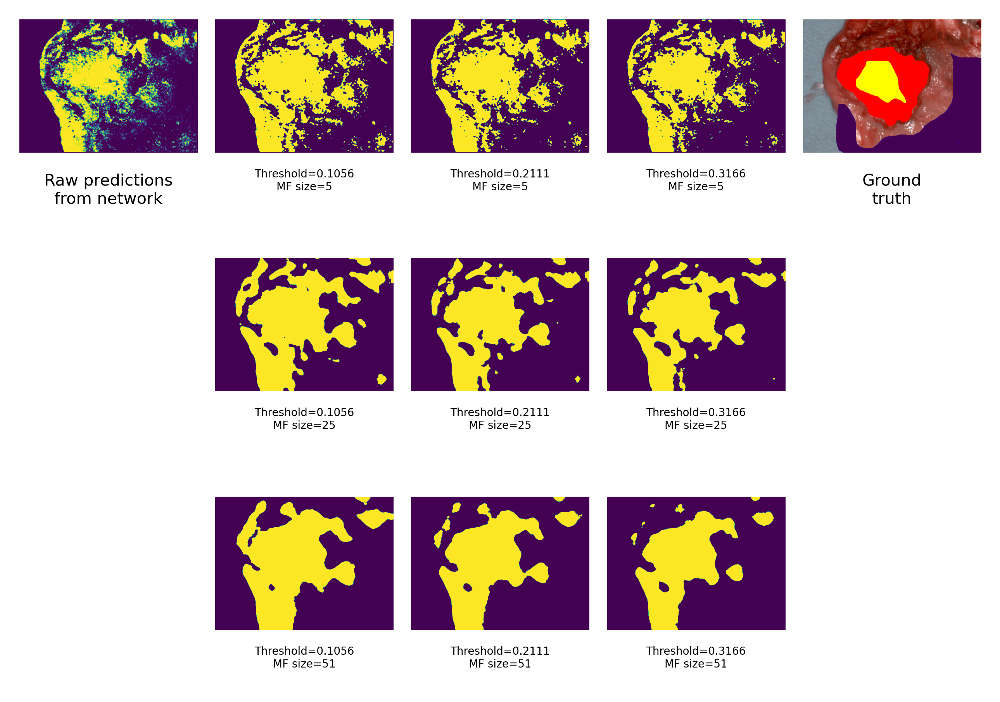

/work/users/mi186veva/data_dat/2020_06_10_16_35_27_SpecCube.dat_Mask JW Kolo.png


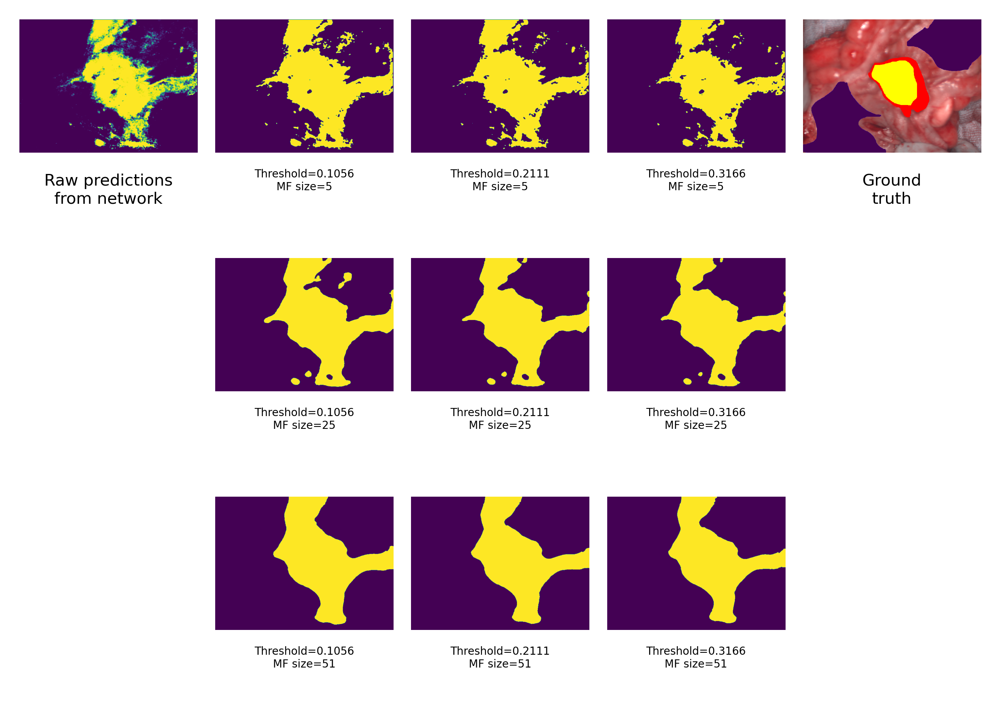

In [8]:
# Figures 14,15
# to get Figure 14 use draw_AWT()
# to get Figure 15 use draw_AP()
# examples of calls of these functions are in the end of the cell

home = '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test'
model = 'CV_3d_inception'
checkpoint = 'cp-l2_norm_0036'

masks = glob('/work/users/mi186veva/data_dat/*.png')

def read_csv(folder, name):
    with open(os.path.join(folder, name), newline='') as csvfile:
        report_reader = csv.reader(csvfile, delimiter=',', quotechar='|')
        next(report_reader)
        data = []
        for row in report_reader:
            data.append(row)
    data = np.array(data)
            
    thresholds = data[:, 2].astype(float)
    medians = data[thresholds > 0, -1].astype(float)
    thresholds = thresholds[thresholds > 0]

    return data, thresholds, medians

def print_for_every_median_unique_thresholds(medians, thresholds):
    print(np.unique(thresholds))
    print(np.unique(medians))
    
    print('=============================================================')
    
    for m in np.unique(medians):
        print(m, np.unique(thresholds[medians == m]))
        print('----------------------------------------------------------------------')
        
def get_predictions_index(predictions, name):
    for  pr_i, pr in enumerate(predictions):
        if pr["name"] == name:
            return pr_i
    return None

def turn_off_axis(ax):
    for i in range(len(ax)):
        for j in range(len(ax[0])):
            ax[i, j].axis('off')

def draw_AWT(folder, patients_indexes, medians_range, thresholds_range, name):
    _, thresholds, medians = read_csv(folder, name)
    
    #print_for_every_median_unique_thresholds(medians, thresholds)    
    
    for p_i, patient in enumerate(patients_indexes):
        fig, ax = plt.subplots(len(medians_range), len(thresholds_range) + 2, dpi=500)
        plt.subplots_adjust(
                    wspace=0.1,
                    hspace=0.)
        turn_off_axis(ax)
        print(masks[patient])
        name = masks[patient].split('/')[-1].split('Spec')[0]
        gt = iio.imread(masks[patient])
        gt[(gt[:, :, 0] == 0) & (gt[:, :, 1] == 0) & (gt[:, :, 2] == 255)] = (68, 1, 84) #change color from blue to violet for consistency
        ax[0,-1].imshow(gt)
        ax[0, -1].set_title('Ground\ntruth', fontdict={'fontsize': 6}, y=-0.5)
        
        predictions = np.load(os.path.join(folder, 'predictions_whole.npy'), allow_pickle=True)
        pr_index = get_predictions_index(predictions, name)
        
        ax[0, 0].imshow(predictions[pr_index]['predictions'].reshape(predictions[pr_index]['size']))
        ax[0, 0].set_title('Raw predictions\nfrom network', fontdict={'fontsize': 6}, y=-0.5)
        
        for m_i, m in enumerate(medians_range):
            for t_i, t in enumerate(thresholds_range):
                mf_t_folder = os.path.join(folder, f'mf_{m}_t_{t}')
                predictions_filtered = np.load(os.path.join(mf_t_folder, 'predictions_filtered.npy'), allow_pickle=True).item()
                ax[m_i, t_i + 1].imshow(predictions_filtered[name]['predictions'])
                ax[m_i, t_i + 1].set_title(f'Threshold={t}\nMF size={m}', fontdict={'fontsize': 4}, y=-0.4)
                
                
        plt.savefig(os.path.join('images', 'AWT_'+name+'.png'))
        plt.show()
       
            

def draw_AP(folder, patients_indexes, medians_range):
    
    fig, ax = plt.subplots(len(patients_indexes), len(medians_range)+2, dpi=500)
    
    for p_i, patient in enumerate(patients_indexes):
        
        plt.subplots_adjust(wspace=0.1, hspace=0.)
        turn_off_axis(ax)
        name = masks[patient].split('/')[-1].split('Spec')[0]
        print(masks[patient])
        
        #plot gt
        gt = iio.imread(masks[patient])
        gt[(gt[:, :, 0] == 0) & (gt[:, :, 1] == 0) & (gt[:, :, 2] == 255)] = (68, 1, 84)   #change color to violet for consistancy
        ax[p_i, -1].imshow(gt)
        ax[p_i, -1].set_title('Ground truth', fontdict={'fontsize': 4}, y=-0.22)
        
        #load predictions
        predictions = np.load(os.path.join(folder, 'predictions_whole.npy'), allow_pickle=True)
        pr_index = get_predictions_index(predictions, name)
        
        #plot raw predictions
        ax[p_i, 0].imshow(predictions[pr_index]['predictions'].reshape(predictions[pr_index]['size']))
        ax[p_i, 0].set_title('Raw predictions from network', fontdict={'fontsize': 4}, y=-0.22)
        
        for m_i, m in enumerate(medians_range):
            mf_t_folder = os.path.join(folder, f'mf_{m}_t_-1')
            predictions_filtered = np.load(os.path.join(mf_t_folder, 'predictions_filtered.npy'), allow_pickle=True).item()
            ax[p_i, m_i+1].imshow(predictions_filtered[name]['predictions'])
            ax[p_i, m_i+1].set_title(f'MF size={m}', fontdict={'fontsize': 4}, y=-0.22)
                
    plt.savefig(os.path.join('images', 'AP_'+name+'.png'))
    plt.show()

patients_indexes = [1, 3, 4, 5]
medians_range = [5, 25, 51]
thresholds_range = [0.1056, 0.2111, 0.3166]

folder = os.path.join(home, model, checkpoint)
draw_AWT(folder, patients_indexes, medians_range, thresholds_range, 'compare_all_thresholds_filtered_AP.csv')
#draw_AP(folder, patients_indexes, medians_range)




<h1 style="text-align: center;"> Statistical significance of using post-processing (T-test) </h1>

In [9]:
# Calculate statistical significance of using post-processing (metrics without and with post-processing) for each model

from scipy.stats import ttest_rel

post_processing_paths = [
    'CV_3d_inception/cp-l2_norm_0036/',
    'CV_3d_inception_exclude1_all/cp-svn_T_0016',
    'CV_3d_inception_svn_every_third/cp-svn_T_0018',
    'CV_3d_svn_every_third/cp-svn_T_0016',
    'CV_3d_sample_weights_every_third/cp-svn_T_0018',
    'CV_3d_every_third/cp-l2_norm_0016',
    'CV_3d_inception_exclude1_every_third/cp-svn_T_0016',
]

old_metrics_paths = ['hsi-experiments/test/CV_3d_inception/cp-0036/metrics_by_threshold_0.2111.csv',
'hsi-experiments/test/CV_3d_inception_exclude1_all/cp-0016/metrics_by_threshold_0.0189.csv',
'hsi-experiments/test/CV_3d_inception_svn_every_third/cp-0018/metrics_by_threshold_0.0456.csv',
'hsi-experiments/test/CV_3d_svn_every_third/cp-0016/metrics_by_threshold_0.0367.csv',
'hsi-experiments/test/CV_3d_sample_weights_every_third/cp-0018/metrics_by_threshold_0.45.csv',
'hsi-experiments/test/CV_3d_every_third/cp-0016/metrics_by_threshold_0.1556.csv',
'hsi-experiments/test/CV_3d_inception_exclude1_every_third/cp-0016/metrics_by_threshold_0.0456.csv'
]


models = ['Inc_Norm_4_T',
'Inc_Stan_1_F',
'Inc_Stan_4_T',
'RS_Stan_4_T',
'RS_Stan_4_T + SW',
'RS_Norm_4_T',
'Inc_Stan_1_T'
]

post_thresholds = [ 0.3166,
0.009,
0.0192,
0.0251,
0.2842,
0.1515,
0.0168
]


post_mf_sizes = [51,
41,
51,
75,
41,
41,
51
]

test_path = '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test/'
home_path = '/home/sc.uni-leipzig.de/mi186veva/'


for old_thresholds_path, post_path, post_threshold, mf_size, model in zip(old_metrics_paths, post_processing_paths,  post_thresholds, post_mf_sizes, models):    
    print(f'------------------{model}----------------')
    
    old_metrics = pd.read_csv(os.path.join(home_path, old_thresholds_path), header=0, decimal=',')
    new_metrics = pd.read_csv(os.path.join(test_path, post_path, f'mf_{mf_size}_t_-1', f'metrics_by_threshold_filtered_{mf_size}_{post_threshold}.csv' ), header=0)
    
    sensitivity_isnan = np.array(np.invert(np.isnan(new_metrics['Sensitivity'])))[:-3]
    specificity_isnan = np.array(np.invert(np.isnan(new_metrics['Specificity'])))[:-3]

    for metric in ['Sensitivity', 'Specificity', 'Accuracy', 'F1-score_healthy', 'F1-score_cancer',  'MCC', 'AUC']:
        old_name = metric #this part is needed because in old .csv columns sometimes had different names
        if metric == 'Accuracy':
            old_name = 'accuracy'
        if metric == 'F1-score_healthy':
            old_name = 'Dice 0'
        if metric == 'F1-score_cancer':
            old_name = 'Dice 1'
        def replace(arr):
            arr_ = np.empty(arr.shape)
            for i in range(arr.shape[0]):
                arr_[i] = arr[i].replace(',', '.')
            arr_ = np.array(arr_, dtype=float)
            return arr_
        
        new_metrics_ = np.array(new_metrics[metric])[:-3]        #:-3 to exclude mean, median and std of metrics
        old_metrics_ = np.array(old_metrics[old_name], dtype=str)[:-3]
        old_metrics_ = replace(old_metrics_)
        
        if metric == 'F1-score_healthy':  #this part is needed to avoid nan's
            old_metrics_ = old_metrics_[specificity_isnan]
            new_metrics_ = new_metrics_[specificity_isnan]
        elif metric == 'F1-score_cancer':
            old_metrics_ = old_metrics_[sensitivity_isnan]
            new_metrics_ = new_metrics_[sensitivity_isnan]
        else:
            old_metrics_ = old_metrics_[np.invert(np.isnan(new_metrics_))]
            new_metrics_ = new_metrics_[np.invert(np.isnan(new_metrics_))]
        
        print(f'T-test {metric}:', ttest_rel(old_metrics_, new_metrics_))
        

------------------Inc_Norm_4_T----------------
T-test Sensitivity: TtestResult(statistic=-2.135748358374023, pvalue=0.038055465099939165, df=46)
T-test Specificity: TtestResult(statistic=-5.793501409944728, pvalue=3.64749449799739e-07, df=54)
T-test Accuracy: TtestResult(statistic=-6.388360506581218, pvalue=3.7704660554868516e-08, df=55)
T-test F1-score_healthy: TtestResult(statistic=-2.3451581807553965, pvalue=0.0227238183520416, df=54)
T-test F1-score_cancer: TtestResult(statistic=-4.89013664029549, pvalue=1.2697235734081565e-05, df=46)
T-test MCC: TtestResult(statistic=-4.876400920531803, pvalue=1.3866848572008021e-05, df=45)
T-test AUC: TtestResult(statistic=-4.233531675413289, pvalue=0.00011192632782310706, df=45)
------------------Inc_Stan_1_F----------------
T-test Sensitivity: TtestResult(statistic=-3.9446197339971816, pvalue=0.00027087984602131243, df=46)
T-test Specificity: TtestResult(statistic=-2.783446733376388, pvalue=0.0073974157209980235, df=54)
T-test Accuracy: TtestRe

In [10]:
# old t-test, where I compared statistical significance just between average metrics before and after post-processing
from scipy.stats import ttest_ind

#for all metrics 0 means 'without post-processing', 1 - 'with post-processing'
sen0 = [89.1, 88.5, 88.0, 87.1, 87.0, 86.8, 86.1]
sen1 = [91.621, 92.555, 92.706, 87.765, 90.461, 90.490, 91.442]
spec0 = [89.5, 88.2, 87.1, 88.3, 86.1, 87.5, 88.0]
spec1 = [93.568, 89.836, 88.373, 91.595, 86.738, 90.058, 88.660]
f1h0 = [92.7, 92.5, 91.5, 92.7, 90.5, 91.6, 92.0]
f1h1 = [95.317, 93.423, 91.461, 94.986, 90.050, 93.146, 91.938]
f1c0 = [66.6, 60.8, 59, 61.4, 59.1, 62.6, 60.3]
f1c1 = [78.445, 70.994, 68.781, 68.682, 67.286, 71.917, 69.140]
mcc0 = [64.3, 59.7, 57.8, 60.3, 57.4, 61.4, 59.1]
mcc1 = [76.639, 69.526, 66.490, 68.09, 65.399, 71.490, 67.573]
auc0 = [96.8, 95.7, 95.6, 95.5, 95.2, 94.9, 95.5]
auc1 = [91.969, 90.666, 97.216, 96.655, 96.905, 97.597, 97.150]
acc0 = [90.2,89.2,87.6,89.0,87.1,88.1,88.6]
acc1 = [94.22, 90.98, 89.16, 92.8, 88.08, 90.85, 89.87]

print('Sensitivity:', ttest_ind(sen0, sen1))
print('Specificity: ', ttest_ind(spec0, spec1))
print('F1-healthy: ', ttest_ind(f1h0, f1h1))
print('F1-cance: ', ttest_ind(f1c0, f1c1))
print('MCC:', ttest_ind(mcc0, mcc1))
print('AUC:', ttest_ind(auc0, auc1))
print('Accuracy', ttest_ind(acc0, acc1))

Sensitivity: Ttest_indResult(statistic=-4.658329406679518, pvalue=0.0005524710620483169)
Specificity:  Ttest_indResult(statistic=-2.1503182894652033, pvalue=0.052613368097190326)
F1-healthy:  Ttest_indResult(statistic=-1.25055475115465, pvalue=0.23493229956012582)
F1-cance:  Ttest_indResult(statistic=-5.430680915969149, pvalue=0.00015233776970201429)
MCC: Ttest_indResult(statistic=-5.526979808771607, pvalue=0.0001304901299403459)
AUC: Ttest_indResult(statistic=0.13467509646073436, pvalue=0.8951012735228112)
Accuracy Ttest_indResult(statistic=-2.595671083590928, pvalue=0.023411961251954893)


<h1 style="text-align: center;"> Other stuff for paper: 1) colorbars, 2) comparing with Martinez et al. 3) draw sigmoid </h1>

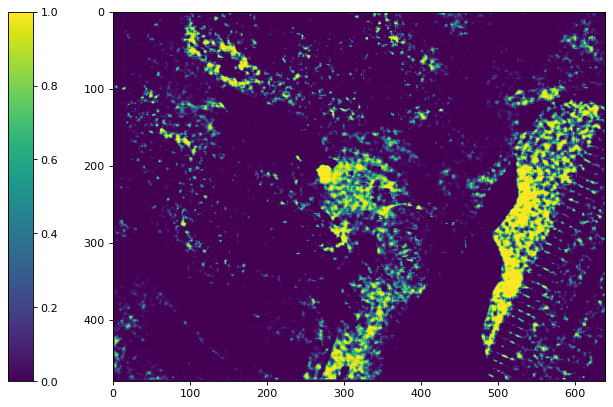

In [11]:
#For some papers in the paper I needed colorbars to emphasize that some image contains probabilitis (values in range 0-1)
# Here is a playground to generate horizontal and vertical colorbars

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.pyplot import figure

colorbar = 'vertical' # or 'vertical'

prediction_maps = get_prediction_maps()

figure(figsize=(10, 6), dpi=80)
#figure( figsize=(5, 3))

ax = plt.subplot()
im = np.array(prediction_maps[0])
im = ax.imshow(im)

divider = make_axes_locatable(ax)
#cax = divider.append_axes("bottom", size="5%", pad=0.4)

if colorbar == 'horizontal':
    cax = divider.append_axes("bottom", size="5%", pad=0.4)
    plt.colorbar(im, cax=cax, orientation='horizontal')

if colorbar == 'vertical':
    cax = divider.append_axes("left", size="5%", pad=1)
    plt.colorbar(im, cax=cax, orientation='vertical')

plt.show()

In [12]:
# comparing results of this paper with Martinez et al.: https://www.mdpi.com/1953240
# where there were used the same dataset but only 12 patients

# patients that were used by Beatriz
patients = ['2019_07_12_11_15_49',
'2019_07_15_11_33_28',
'2019_07_17_15_38_14',
'2019_07_25_11_56_38',
'2019_08_09_12_17_55',
'2019_08_12_10_52_33',
'2019_08_28_14_00_34',
'2019_09_04_12_43_40',
'2019_09_30_20_50_43',
'2019_10_24_15_53_04',
'2019_10_25_11_19_55',
'2019_08_23_12_15_26']

patients_indexes = [3, 0, 26, 28, 31, 16, 49, 1, 40, 34, 24, 13]

metrics_post = pd.read_csv('/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test/CV_3d_inception/cp-l2_norm_0036/mf_51_t_0.3166/metrics_by_threshold_filtered_51_0.3166.csv', header=0)

for metric, old_value in zip(['Accuracy', 'Sensitivity', 'Specificity', 'F1-score_healthy', 'F1-score_cancer', 'AUC', 'MCC'], [0.8640, 0.8604, 0.8715, 0.9135, 0.5170, 0.9386, 0.5154]):
    print(metric, " (Beatriz -> my)", old_value, '->', np.nanmean(np.array(metrics_post[metric])[patients_indexes]))


Accuracy  (Beatriz -> my) 0.864 -> 0.9443124424774675
Sensitivity  (Beatriz -> my) 0.8604 -> 0.9951586874663798
Specificity  (Beatriz -> my) 0.8715 -> 0.9306851156597636
F1-score_healthy  (Beatriz -> my) 0.9135 -> 0.9600077897354525
F1-score_cancer  (Beatriz -> my) 0.517 -> 0.7889372279713054
AUC  (Beatriz -> my) 0.9386 -> 0.955990413129048
MCC  (Beatriz -> my) 0.5154 -> 0.7930733421636241


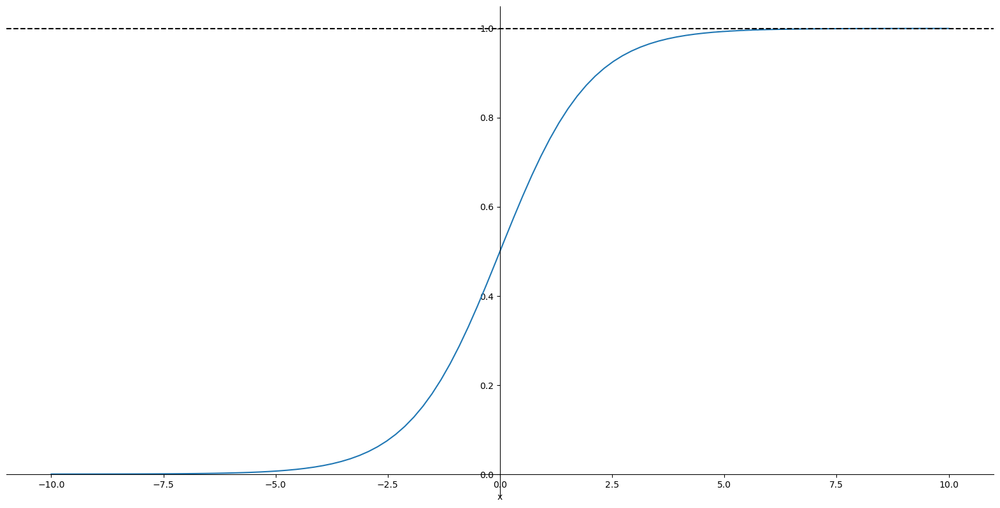

In [13]:
#draw sigmoid function
import math

plt.figure(figsize=(20,10)) 
  
x = np.linspace(-10, 10, 100)
z = 1/(1 + np.exp(-x))

ax = plt.gca()
ax.spines['top'].set_color('none')
ax.spines['left'].set_position('zero')
ax.spines['right'].set_color('none')
ax.spines['bottom'].set_position('zero')

ax.plot(x, z)
plt.xlabel("x")
ax.axhline(y=1, color='k', ls='--')
  
plt.show()

<h1 style="text-align: center;"> Some experiments </h1>

In [14]:
# this part is created to show on example that median filter and thresholding operations are commutative
# The proof and more details about this fact you can find in Appendix B of the paper

threshold = 30
print(f'Threshold:{threshold}')
print('-----------------------------------')

arr = np.random.randint(100, size=(6, 6))
print('arr')
print(arr)
arr_thresholded = arr.copy()
arr_thresholded[arr>=threshold] = 100
arr_thresholded[arr<threshold] = 0
print('arr_thresholded')
print(arr_thresholded)

arr_thresholded_filtered = median_filter(arr_thresholded, size=3)
print('arr_thresholded_filtered')
print(arr_thresholded_filtered)

print('-----------------------------------')

arr_filtered = median_filter(arr, size=3)
print('arr_filtered')
print(arr_filtered)
arr_filtered_thresholded = arr_filtered.copy()
arr_filtered_thresholded[arr_filtered>=threshold] = 100
arr_filtered_thresholded[arr_filtered<threshold] = 0
print('arr_filtered_thresholded')
print(arr_filtered_thresholded)


Threshold:30
-----------------------------------
arr
[[76 93 15 79  5 39]
 [47 95 40 34 40 89]
 [15 85 87 33 57  6]
 [89 32 65 28 38 35]
 [81 78  9 75 93 43]
 [62 65 13 91 82 51]]
arr_thresholded
[[100 100   0 100   0 100]
 [100 100 100 100 100 100]
 [  0 100 100 100 100   0]
 [100 100 100   0 100 100]
 [100 100   0 100 100 100]
 [100 100   0 100 100 100]]
arr_thresholded_filtered
[[100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]]
-----------------------------------
arr_filtered
[[76 76 79 34 39 39]
 [76 76 79 40 39 39]
 [47 65 40 40 35 38]
 [81 78 65 57 38 38]
 [78 65 65 65 51 43]
 [65 62 65 82 82 51]]
arr_filtered_thresholded
[[100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]
 [100 100 100 100 100 100]]


2019_07_12_11_15_49_


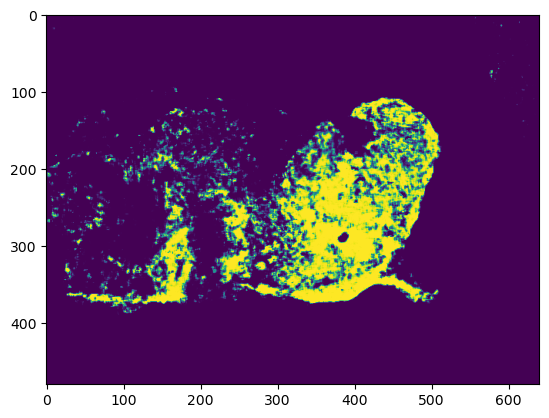

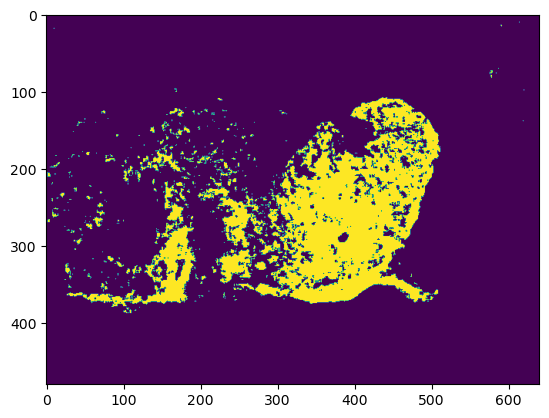

In [15]:
# part for checking how prediction maps look after applying of some threshold (thresholding)

predictions = np.load('/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test/CV_3d_inception/cp-l2_norm_0036/predictions_whole.npy', allow_pickle=True)#.item

for row in predictions:
    if row['name'] == '2019_07_12_11_15_49_':   #change the name of patient here to see another predictions maps
        print(row['name'])
        pred = np.resize(row['predictions'], (row['size']))
        plt.imshow(pred)
        plt.show()
        
        plt.imshow(np.where(pred > 0.3, 1, 0))

In [16]:
# part of AUC debagging (nothing intersting)

predictions_filtered_labeled = np.load('/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/test/CV_3d_inception/cp-l2_norm_0036/mf_51_t_0.3166/predictions_filtered_labeled.npy', allow_pickle=True)

np.unique(predictions_filtered_labeled[1]['predictions'])

array([0., 1.], dtype=float32)

0.5


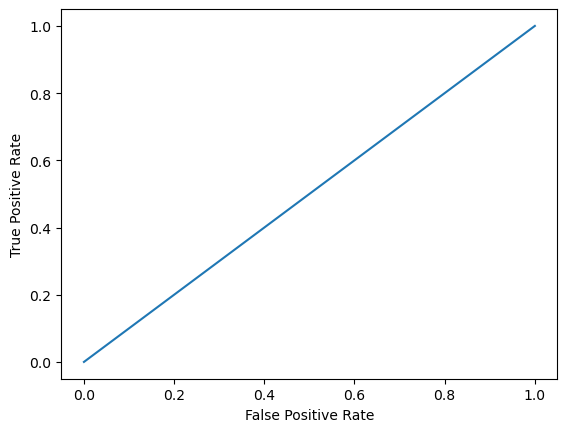

In [17]:
# just tried to understand how ROC AUC works
from sklearn.metrics import auc, roc_auc_score
import sklearn.metrics as metrics

gt = [0, 1, 1, 0]
#pred = [0.1, 0.8, 0.2, 0.3]
pred = [0, 1, 0, 0] #threshold = 0.4
pred = [0, 1, 0, 1] #threshold = 0.23

print(roc_auc_score(gt, pred))

fpr, tpr, _ = metrics.roc_curve(gt,  pred)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()
